# Mask R-CNN Demo

A quick intro to using the pre-trained model to detect and segment objects.

In [1]:
import os
import sys
import random
import math
import numpy as np
import skimage.io
import matplotlib
import matplotlib.pyplot as plt

# Root directory of the project
ROOT_DIR = os.path.abspath("../")

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library
from mrcnn import utils
import mrcnn.model as modellib
from mrcnn import visualize
# Import COCO config
sys.path.append(os.path.join(ROOT_DIR, "samples/coco/"))  # To find local version
import coco

%matplotlib inline 

# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

# Local path to trained weights file
COCO_MODEL_PATH = os.path.join(ROOT_DIR, "mask_rcnn_coco.h5")
# Download COCO trained weights from Releases if needed
if not os.path.exists(COCO_MODEL_PATH):
    utils.download_trained_weights(COCO_MODEL_PATH)

# Directory of images to run detection on
IMAGE_DIR = os.path.join(ROOT_DIR, "customimages")

E:\Anaconda3\envs\tensorflow1.3.0\lib\site-packages\tensorflow\python\framework\dtypes.py:458: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
E:\Anaconda3\envs\tensorflow1.3.0\lib\site-packages\tensorflow\python\framework\dtypes.py:459: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
E:\Anaconda3\envs\tensorflow1.3.0\lib\site-packages\tensorflow\python\framework\dtypes.py:460: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
E:\Anaconda3\envs\tensorflow1.3.0\lib\site-packages\tensorflow\python\framework

## Configurations

We'll be using a model trained on the MS-COCO dataset. The configurations of this model are in the ```CocoConfig``` class in ```coco.py```.

For inferencing, modify the configurations a bit to fit the task. To do so, sub-class the ```CocoConfig``` class and override the attributes you need to change.

In [2]:
class InferenceConfig(coco.CocoConfig):
    # Set batch size to 1 since we'll be running inference on
    # one image at a time. Batch size = GPU_COUNT * IMAGES_PER_GPU
    GPU_COUNT = 1
    IMAGES_PER_GPU = 2

config = InferenceConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     2
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 2
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                93
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE         

## Create Model and Load Trained Weights

In [3]:
# Create model object in inference mode.
model = modellib.MaskRCNN(mode="inference", model_dir=MODEL_DIR, config=config)

# Load weights trained on MS-COCO
model.load_weights(COCO_MODEL_PATH, by_name=True)

## Class Names

The model classifies objects and returns class IDs, which are integer value that identify each class. Some datasets assign integer values to their classes and some don't. For example, in the MS-COCO dataset, the 'person' class is 1 and 'teddy bear' is 88. The IDs are often sequential, but not always. The COCO dataset, for example, has classes associated with class IDs 70 and 72, but not 71.

To improve consistency, and to support training on data from multiple sources at the same time, our ```Dataset``` class assigns it's own sequential integer IDs to each class. For example, if you load the COCO dataset using our ```Dataset``` class, the 'person' class would get class ID = 1 (just like COCO) and the 'teddy bear' class is 78 (different from COCO). Keep that in mind when mapping class IDs to class names.

To get the list of class names, you'd load the dataset and then use the ```class_names``` property like this.
```
# Load COCO dataset
dataset = coco.CocoDataset()
dataset.load_coco(COCO_DIR, "train")
dataset.prepare()

# Print class names
print(dataset.class_names)
```

We don't want to require you to download the COCO dataset just to run this demo, so we're including the list of class names below. The index of the class name in the list represent its ID (first class is 0, second is 1, third is 2, ...etc.)

In [4]:
# COCO Class names
# Index of the class in the list is its ID. For example, to get ID of
# the teddy bear class, use: class_names.index('teddy bear')
class_names = ['BG', 'person', 'bicycle', 'car', 'motorcycle', 'airplane',
               'bus', 'train', 'truck', 'boat', 'traffic light',
               'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird',
               'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear',
               'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie',
               'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
               'kite', 'baseball bat', 'baseball glove', 'skateboard',
               'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup',
               'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple',
               'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
               'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed',
               'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote',
               'keyboard', 'cell phone', 'microwave', 'oven', 'toaster',
               'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors',
               'teddy bear', 'hair drier', 'toothbrush']

## Run Object Detection

In [5]:
import scipy

def mate_classes(image1,image2,rois1,rois2,rclass1,rclass2,r1masks,r2masks,r1scores,r2scores):
    matelist = list()
    for i,r1c in enumerate(rclass1):
        sim_maxscore= 0
        max_j=0
        for j,r2c in enumerate(rclass2):
            if r1c==r2c:
                rp1 = image1[rois1[i][0]:rois1[i][2],rois1[i][1]:rois1[i][3]]
                rp2 = image2[rois2[j][0]:rois2[j][2],rois2[j][1]:rois2[j][3]]
                rp1 = skimage.transform.resize(rp1, (min((rois1[i][2] - rois1[i][0]),(rois2[j][2]-rois2[j][0])),\
                                                     min((rois1[i][3] - rois1[i][1]),(rois2[j][3]-rois2[j][1]))))
                rp2 = skimage.transform.resize(rp2, (min((rois1[i][2] - rois1[i][0]),(rois2[j][2]-rois2[j][0])),\
                                                     min((rois1[i][3] - rois1[i][1]),(rois2[j][3]-rois2[j][1]))))
                height_diff = abs((rois1[i][2] - rois1[i][0])-(rois2[j][2]-rois2[j][0]))
                width_diff = abs((rois1[i][3] - rois1[i][1])-(rois2[j][3]-rois2[j][1]))
                if height_diff > 50 or width_diff > 120: continue
                sim, _ = skimage.measure.compare_ssim(rp1,rp2,full=True,multichannel=True)
#                 if sim<0.5: continue
                if sim<=sim_maxscore: continue
                sim_maxscore = sim
                max_j = j
                max_j_roi = rois2[j]
                max_j_class = rclass2[j]
                max_j_mask = r2masks[:,:,j]
                max_j_score = r2scores[j]
                ### for debug
#                 print("height diff: {}, width diff: {}".format(height_diff,width_diff))
#                 print(sim)
#                 print(class_names[r1c],class_names[r2c])
#                 fig = plt.figure()
                
#                 fig.add_subplot(1,2,1)
#                 plt.title(class_names[r1c])
#                 plt.imshow(rp1)
#                 plt.axis('off')
#                 fig.add_subplot(1,2,2)
#                 plt.title(class_names[r2c])
#                 plt.imshow(rp2)
#                 plt.axis('off')
#                 plt.show()
                ###
        if sim_maxscore == 0: continue
        matelist.append((i,rois1[i],r1c,r1masks[:,:,i],r1scores[i],max_j,max_j_roi,max_j_class,max_j_mask,max_j_score))
    return np.array(matelist)
                

In [6]:
from mrcnn.visualize_custom import display_compare_instances

Processing 2 images
image                    shape: (1080, 1920, 3)       min:    0.00000  max:  255.00000  uint8
image                    shape: (1080, 1920, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (2, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (2, 93)               min:    0.00000  max: 1920.00000  float64
anchors                  shape: (2, 261888, 4)        min:   -0.35390  max:    1.29134  float32


E:\Anaconda3\envs\tensorflow1.3.0\lib\site-packages\ipykernel_launcher.py:19: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.


dining table 0.993 25.50pxd 647.4cm
person 0.978 33.06pxd 492.0cm
chair 0.977 193.93pxd 80.6cm
chair 0.943 42.99pxd 374.1cm
chair 0.941 54.56pxd 292.5cm
bottle 0.916 1026.54pxd 15.1cm


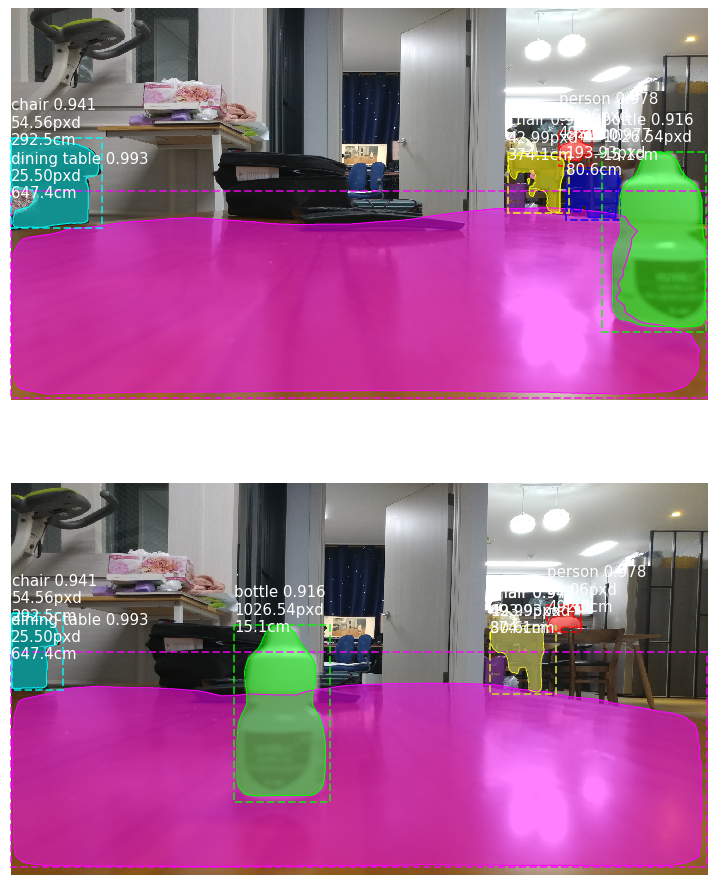

In [7]:
image1 = skimage.io.imread(os.path.join(IMAGE_DIR, '20200303_191031.jpg'))
image2 = skimage.io.imread(os.path.join(IMAGE_DIR, '20200303_191048.jpg'))

# Run detection
results = model.detect([image1,image2], verbose=1)

# Visualize results
r1, r2 = results[0], results[1]

matelist = mate_classes(image1,image2,r1['rois'],r2['rois'],r1['class_ids'],r2['class_ids'],r1['masks'],r2['masks'],r1['scores'],r2['scores'])

display_compare_instances(image1, image2, matelist,class_names) #15cm distance

Processing 2 images
image                    shape: (1080, 1920, 3)       min:    0.00000  max:  255.00000  uint8
image                    shape: (1080, 1920, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (2, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (2, 93)               min:    0.00000  max: 1920.00000  float64
anchors                  shape: (2, 261888, 4)        min:   -0.35390  max:    1.29134  float32


E:\Anaconda3\envs\tensorflow1.3.0\lib\site-packages\ipykernel_launcher.py:19: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.


person 0.993 52.77pxd 302.7cm
chair 0.992 69.86pxd 227.0cm
dining table 0.992 0.50pxd -14760.1cm
refrigerator 0.987 33.56pxd 484.4cm
chair 0.972 82.22pxd 192.2cm
dining table 0.907 99.23pxd 158.7cm
chair 0.885 1437.60pxd 10.8cm
bottle 0.769 799.01pxd 19.4cm


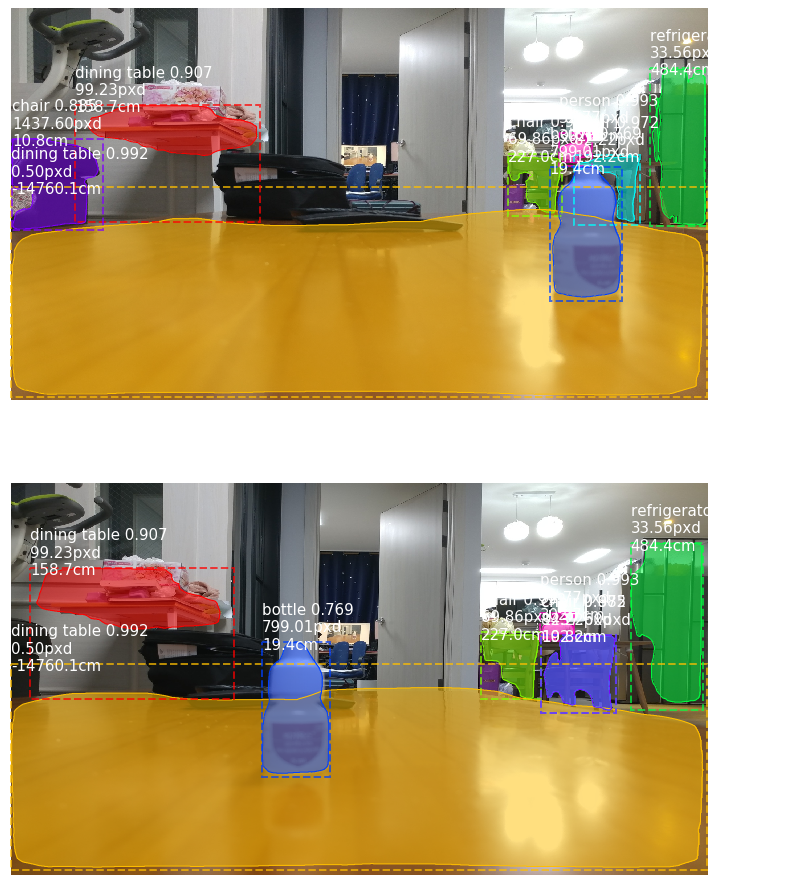

In [8]:
image1 = skimage.io.imread(os.path.join(IMAGE_DIR, '20200303_191114.jpg'))
image2 = skimage.io.imread(os.path.join(IMAGE_DIR, '20200303_191122.jpg'))

# Run detection
results = model.detect([image1,image2], verbose=1)

# Visualize results
r1, r2 = results[0], results[1]

matelist = mate_classes(image1,image2,r1['rois'],r2['rois'],r1['class_ids'],r2['class_ids'],r1['masks'],r2['masks'],r1['scores'],r2['scores'])

display_compare_instances(image1, image2, matelist,class_names) #20cm distance

Processing 2 images
image                    shape: (1080, 1920, 3)       min:    0.00000  max:  255.00000  uint8
image                    shape: (1080, 1920, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (2, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (2, 93)               min:    0.00000  max: 1920.00000  float64
anchors                  shape: (2, 261888, 4)        min:   -0.35390  max:    1.29134  float32


E:\Anaconda3\envs\tensorflow1.3.0\lib\site-packages\ipykernel_launcher.py:19: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.


chair 0.995 60.17pxd 264.5cm
dining table 0.994 8.00pxd 2403.8cm
refrigerator 0.990 14.23pxd 1222.7cm
tv 0.930 46.01pxd 348.7cm
dining table 0.855 82.45pxd 191.6cm
bottle 0.853 639.28pxd 24.3cm
chair 0.780 1583.87pxd 9.8cm
chair 0.757 36.37pxd 445.3cm


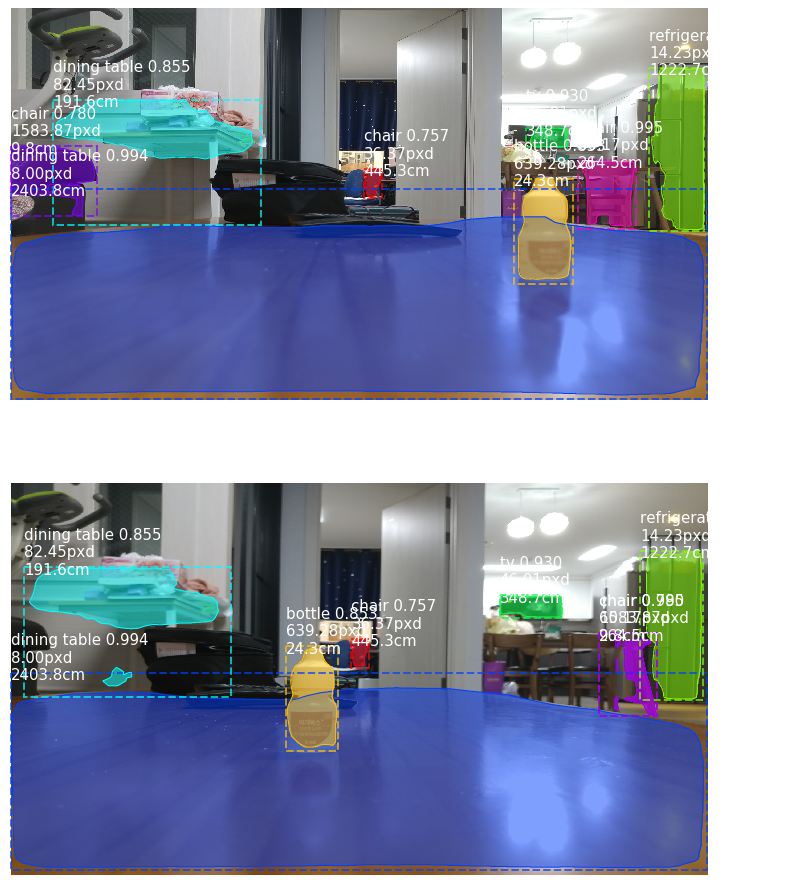

In [9]:
image1 = skimage.io.imread(os.path.join(IMAGE_DIR, '20200303_191150.jpg'))
image2 = skimage.io.imread(os.path.join(IMAGE_DIR, '20200303_191201.jpg'))

# Run detection
results = model.detect([image1,image2], verbose=1)

# Visualize results
r1, r2 = results[0], results[1]

matelist = mate_classes(image1,image2,r1['rois'],r2['rois'],r1['class_ids'],r2['class_ids'],r1['masks'],r2['masks'],r1['scores'],r2['scores'])

display_compare_instances(image1, image2, matelist,class_names) #25cm distance

Processing 2 images
image                    shape: (1080, 1920, 3)       min:    0.00000  max:  255.00000  uint8
image                    shape: (1080, 1920, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (2, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (2, 93)               min:    0.00000  max: 1920.00000  float64
anchors                  shape: (2, 261888, 4)        min:   -0.35390  max:    1.29134  float32


E:\Anaconda3\envs\tensorflow1.3.0\lib\site-packages\ipykernel_launcher.py:19: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.


chair 0.995 48.71pxd 328.8cm
dining table 0.994 14.00pxd 1245.3cm
chair 0.974 149.06pxd 105.1cm
refrigerator 0.966 60.56pxd 262.7cm
chair 0.940 1581.07pxd 9.8cm
handbag 0.742 204.62pxd 76.3cm


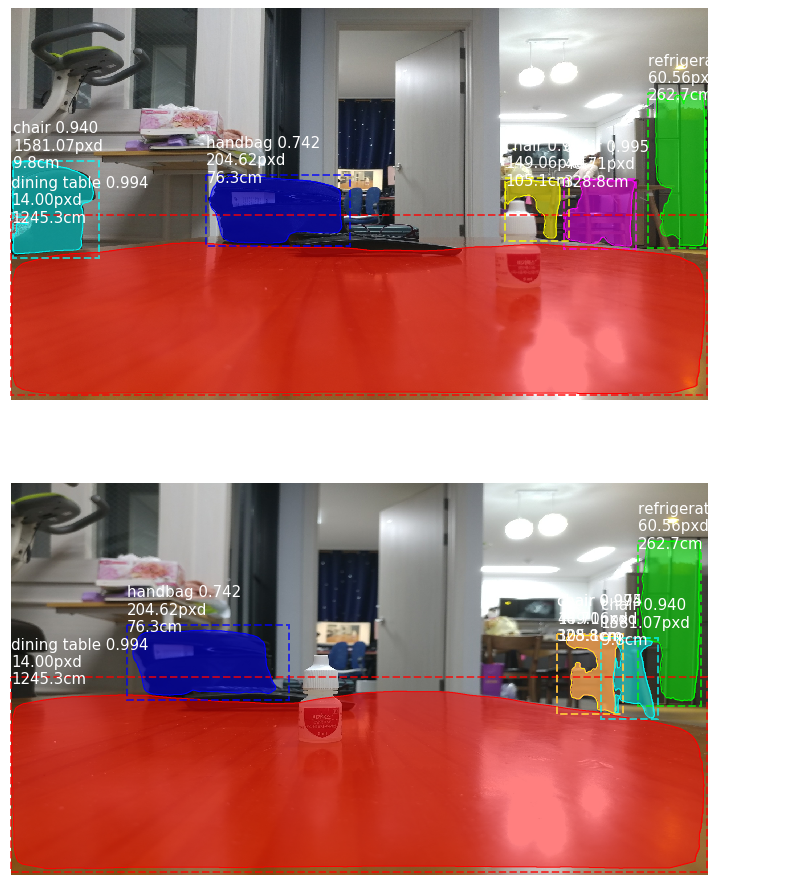

In [10]:
image1 = skimage.io.imread(os.path.join(IMAGE_DIR, '20200303_191247.jpg'))
image2 = skimage.io.imread(os.path.join(IMAGE_DIR, '20200303_191255.jpg'))

# Run detection
results = model.detect([image1,image2], verbose=1)

# Visualize results
r1, r2 = results[0], results[1]

matelist = mate_classes(image1,image2,r1['rois'],r2['rois'],r1['class_ids'],r2['class_ids'],r1['masks'],r2['masks'],r1['scores'],r2['scores'])

display_compare_instances(image1, image2, matelist,class_names) #30cm distance

Processing 2 images
image                    shape: (1080, 1920, 3)       min:    0.00000  max:  255.00000  uint8
image                    shape: (1080, 1920, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (2, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (2, 93)               min:    0.00000  max: 1920.00000  float64
anchors                  shape: (2, 261888, 4)        min:   -0.35390  max:    1.29134  float32


E:\Anaconda3\envs\tensorflow1.3.0\lib\site-packages\ipykernel_launcher.py:19: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.


chair 0.996 48.54pxd 329.9cm
chair 0.994 39.60pxd 407.4cm
dining table 0.989 20.50pxd 818.2cm
person 0.983 77.77pxd 203.4cm
chair 0.894 60.21pxd 264.3cm
bottle 0.839 450.13pxd 34.6cm
refrigerator 0.837 28.36pxd 578.3cm


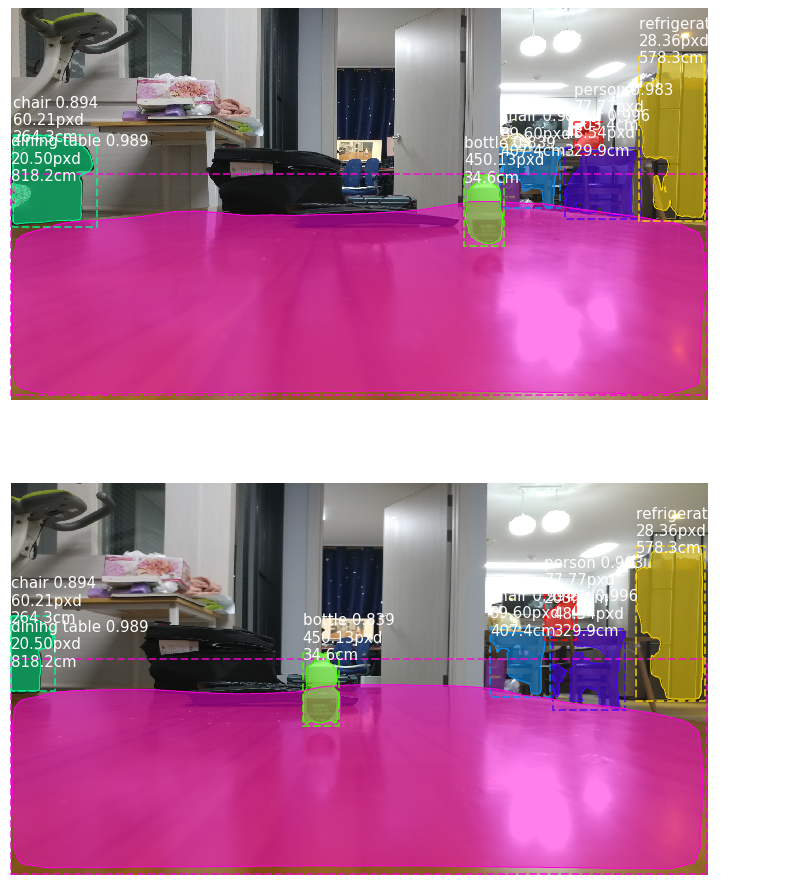

In [11]:
image1 = skimage.io.imread(os.path.join(IMAGE_DIR, '20200303_191326.jpg'))
image2 = skimage.io.imread(os.path.join(IMAGE_DIR, '20200303_191337.jpg'))

# Run detection
results = model.detect([image1,image2], verbose=1)

# Visualize results
r1, r2 = results[0], results[1]

matelist = mate_classes(image1,image2,r1['rois'],r2['rois'],r1['class_ids'],r2['class_ids'],r1['masks'],r2['masks'],r1['scores'],r2['scores'])

display_compare_instances(image1, image2, matelist,class_names) #35cm distance

Processing 2 images
image                    shape: (1080, 1920, 3)       min:    0.00000  max:  255.00000  uint8
image                    shape: (1080, 1920, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (2, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (2, 93)               min:    0.00000  max: 1920.00000  float64
anchors                  shape: (2, 261888, 4)        min:   -0.35390  max:    1.29134  float32


E:\Anaconda3\envs\tensorflow1.3.0\lib\site-packages\ipykernel_launcher.py:19: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.


chair 0.995 44.12pxd 364.2cm
dining table 0.995 8.50pxd 2230.9cm
refrigerator 0.990 29.42pxd 556.4cm
person 0.987 35.36pxd 458.5cm
chair 0.986 48.90pxd 327.4cm
bottle 0.954 404.34pxd 38.5cm
chair 0.774 1475.06pxd 10.5cm


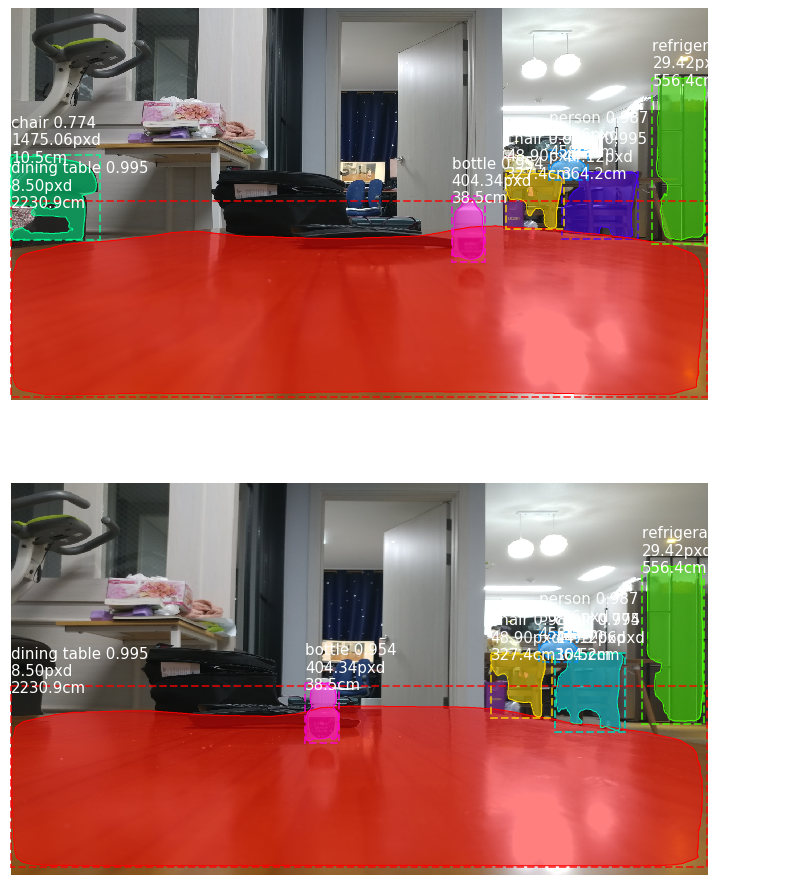

In [12]:
image1 = skimage.io.imread(os.path.join(IMAGE_DIR, '20200303_191411.jpg'))
image2 = skimage.io.imread(os.path.join(IMAGE_DIR, '20200303_191421.jpg'))

# Run detection
results = model.detect([image1,image2], verbose=1)

# Visualize results
r1, r2 = results[0], results[1]

matelist = mate_classes(image1,image2,r1['rois'],r2['rois'],r1['class_ids'],r2['class_ids'],r1['masks'],r2['masks'],r1['scores'],r2['scores'])

display_compare_instances(image1, image2, matelist,class_names) #40cm distance

Processing 2 images
image                    shape: (1080, 1920, 3)       min:    0.00000  max:  255.00000  uint8
image                    shape: (1080, 1920, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (2, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (2, 93)               min:    0.00000  max: 1920.00000  float64
anchors                  shape: (2, 261888, 4)        min:   -0.35390  max:    1.29134  float32


E:\Anaconda3\envs\tensorflow1.3.0\lib\site-packages\ipykernel_launcher.py:19: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.


dining table 0.994 10.69pxd 1696.6cm
chair 0.991 56.36pxd 282.9cm
chair 0.989 66.21pxd 239.8cm
refrigerator 0.980 11.88pxd 1500.2cm
bottle 0.975 360.81pxd 43.2cm
chair 0.926 60.42pxd 263.4cm
chair 0.734 9.06pxd 2065.8cm


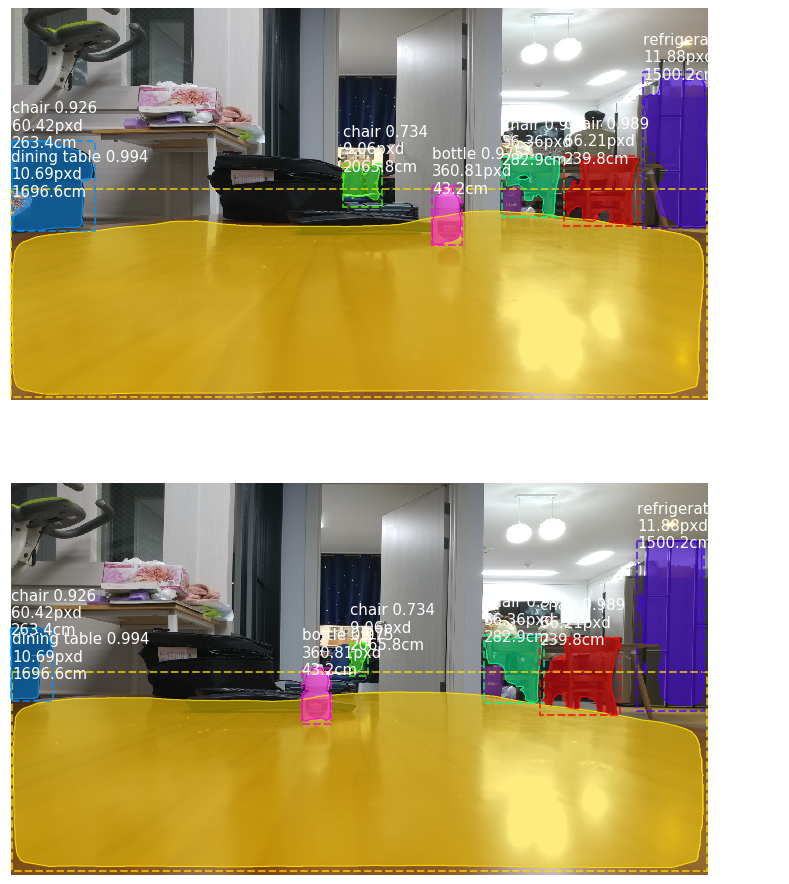

In [13]:
image1 = skimage.io.imread(os.path.join(IMAGE_DIR, '20200303_191448.jpg'))
image2 = skimage.io.imread(os.path.join(IMAGE_DIR, '20200303_191457.jpg'))

# Run detection
results = model.detect([image1,image2], verbose=1)

# Visualize results
r1, r2 = results[0], results[1]

matelist = mate_classes(image1,image2,r1['rois'],r2['rois'],r1['class_ids'],r2['class_ids'],r1['masks'],r2['masks'],r1['scores'],r2['scores'])

display_compare_instances(image1, image2, matelist,class_names) #45cm distance

Processing 2 images
image                    shape: (1080, 1920, 3)       min:    0.00000  max:  255.00000  uint8
image                    shape: (1080, 1920, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (2, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (2, 93)               min:    0.00000  max: 1920.00000  float64
anchors                  shape: (2, 261888, 4)        min:   -0.35390  max:    1.29134  float32


E:\Anaconda3\envs\tensorflow1.3.0\lib\site-packages\ipykernel_launcher.py:19: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.


dining table 0.994 6.50pxd 3132.3cm
chair 0.988 57.02pxd 279.5cm
bottle 0.984 328.53pxd 47.4cm
chair 0.977 120.08pxd 130.8cm
chair 0.966 4.47pxd 5306.4cm
chair 0.926 39.92pxd 404.0cm
chair 0.905 61.53pxd 258.5cm


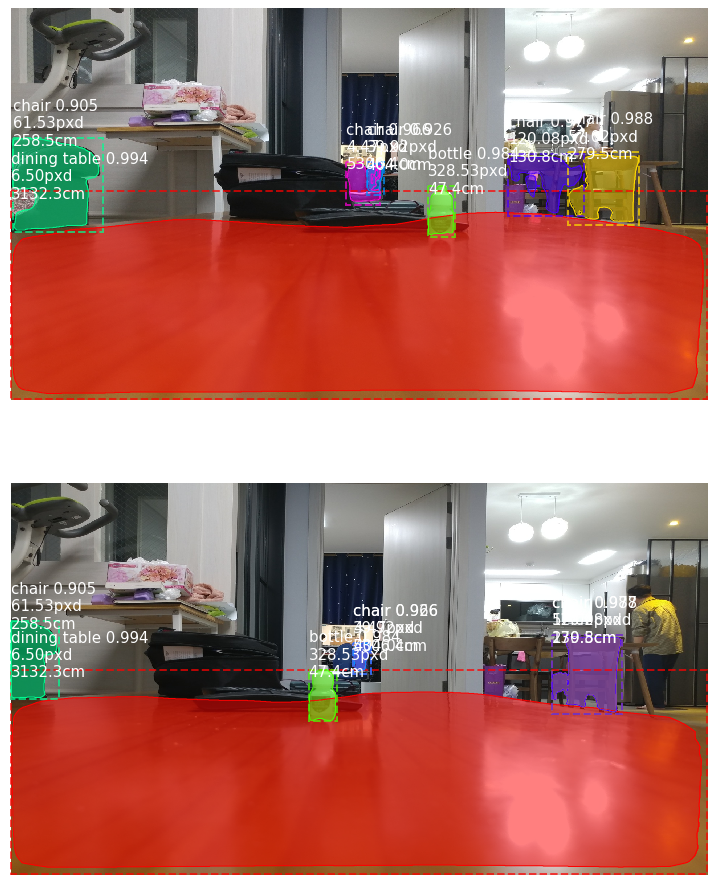

In [14]:
image1 = skimage.io.imread(os.path.join(IMAGE_DIR, '20200303_191542.jpg'))
image2 = skimage.io.imread(os.path.join(IMAGE_DIR, '20200303_191552.jpg'))

# Run detection
results = model.detect([image1,image2], verbose=1)

# Visualize results
r1, r2 = results[0], results[1]

matelist = mate_classes(image1,image2,r1['rois'],r2['rois'],r1['class_ids'],r2['class_ids'],r1['masks'],r2['masks'],r1['scores'],r2['scores'])

display_compare_instances(image1, image2, matelist,class_names) #50cm distance

Processing 2 images
image                    shape: (1080, 1920, 3)       min:    0.00000  max:  255.00000  uint8
image                    shape: (1080, 1920, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (2, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (2, 93)               min:    0.00000  max: 1920.00000  float64
anchors                  shape: (2, 261888, 4)        min:   -0.35390  max:    1.29134  float32


E:\Anaconda3\envs\tensorflow1.3.0\lib\site-packages\ipykernel_launcher.py:19: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.


chair 0.998 36.39pxd 445.0cm
chair 0.996 37.79pxd 427.8cm
bottle 0.990 283.11pxd 55.1cm
handbag 0.891 188.48pxd 82.9cm
chair 0.845 35.09pxd 462.3cm
chair 0.790 41.74pxd 385.7cm


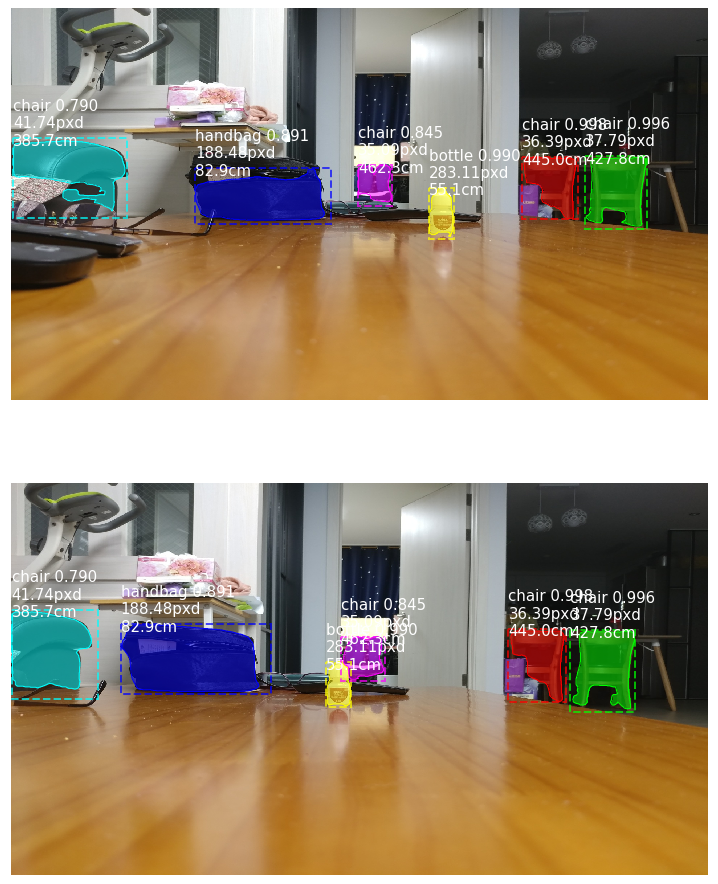

In [15]:
image1 = skimage.io.imread(os.path.join(IMAGE_DIR, '20200303_215412.jpg'))
image2 = skimage.io.imread(os.path.join(IMAGE_DIR, '20200303_215425.jpg'))

# Run detection
results = model.detect([image1,image2], verbose=1)

# Visualize results
r1, r2 = results[0], results[1]

matelist = mate_classes(image1,image2,r1['rois'],r2['rois'],r1['class_ids'],r2['class_ids'],r1['masks'],r2['masks'],r1['scores'],r2['scores'])

display_compare_instances(image1, image2, matelist,class_names) #55cm distance

Processing 2 images
image                    shape: (1080, 1920, 3)       min:    0.00000  max:  255.00000  uint8
image                    shape: (1080, 1920, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (2, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (2, 93)               min:    0.00000  max: 1920.00000  float64
anchors                  shape: (2, 261888, 4)        min:   -0.35390  max:    1.29134  float32


E:\Anaconda3\envs\tensorflow1.3.0\lib\site-packages\ipykernel_launcher.py:19: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.


chair 0.999 79.34pxd 199.3cm
chair 0.997 83.37pxd 189.5cm
bottle 0.991 268.42pxd 58.1cm
chair 0.967 65.91pxd 240.9cm
dining table 0.959 29.26pxd 559.5cm
chair 0.868 72.14pxd 219.6cm
handbag 0.796 203.51pxd 76.8cm


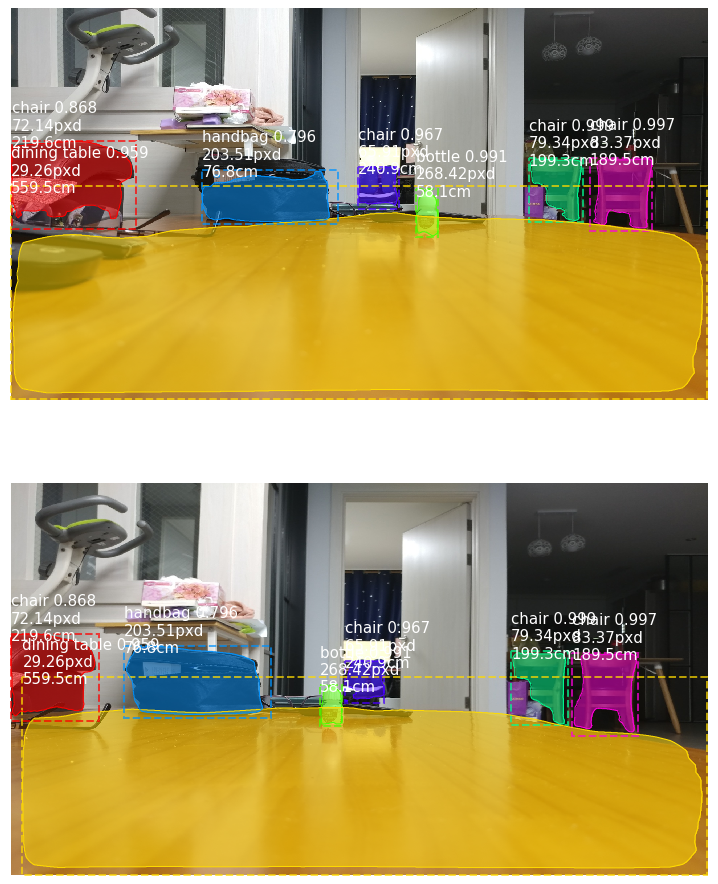

In [16]:
image1 = skimage.io.imread(os.path.join(IMAGE_DIR, '20200303_215514.jpg'))
image2 = skimage.io.imread(os.path.join(IMAGE_DIR, '20200303_215529.jpg'))

# Run detection
results = model.detect([image1,image2], verbose=1)

# Visualize results
r1, r2 = results[0], results[1]

matelist = mate_classes(image1,image2,r1['rois'],r2['rois'],r1['class_ids'],r2['class_ids'],r1['masks'],r2['masks'],r1['scores'],r2['scores'])

display_compare_instances(image1, image2, matelist,class_names) #60cm distance

Processing 2 images
image                    shape: (1080, 1920, 3)       min:    0.00000  max:  255.00000  uint8
image                    shape: (1080, 1920, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (2, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (2, 93)               min:    0.00000  max: 1920.00000  float64
anchors                  shape: (2, 261888, 4)        min:   -0.35390  max:    1.29134  float32


E:\Anaconda3\envs\tensorflow1.3.0\lib\site-packages\ipykernel_launcher.py:19: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.


chair 0.998 51.54pxd 310.1cm
chair 0.996 50.25pxd 318.4cm
bottle 0.991 237.17pxd 65.8cm
dining table 0.982 6.04pxd 3452.1cm
handbag 0.744 189.58pxd 82.5cm


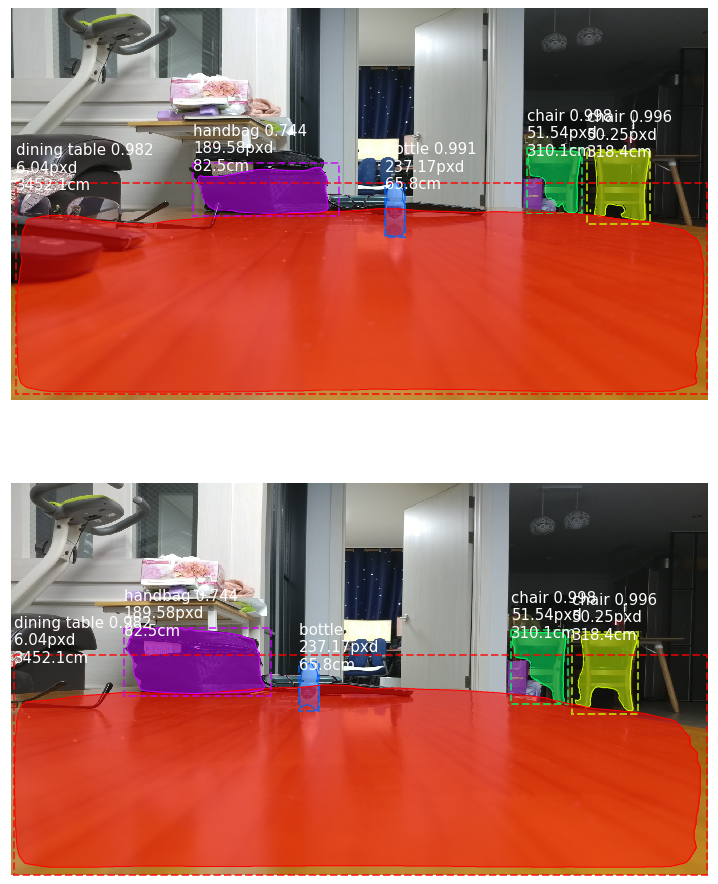

In [17]:
image1 = skimage.io.imread(os.path.join(IMAGE_DIR, '20200303_215608.jpg'))
image2 = skimage.io.imread(os.path.join(IMAGE_DIR, '20200303_215626.jpg'))

# Run detection
results = model.detect([image1,image2], verbose=1)

# Visualize results
r1, r2 = results[0], results[1]

matelist = mate_classes(image1,image2,r1['rois'],r2['rois'],r1['class_ids'],r2['class_ids'],r1['masks'],r2['masks'],r1['scores'],r2['scores'])

display_compare_instances(image1, image2, matelist,class_names) #65cm distance

Processing 2 images
image                    shape: (1080, 1920, 3)       min:    0.00000  max:  255.00000  uint8
image                    shape: (1080, 1920, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (2, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (2, 93)               min:    0.00000  max: 1920.00000  float64
anchors                  shape: (2, 261888, 4)        min:   -0.35390  max:    1.29134  float32


E:\Anaconda3\envs\tensorflow1.3.0\lib\site-packages\ipykernel_launcher.py:19: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.


chair 0.998 63.29pxd 251.1cm
chair 0.997 69.70pxd 227.5cm
bottle 0.993 234.06pxd 66.7cm
handbag 0.801 208.73pxd 74.8cm


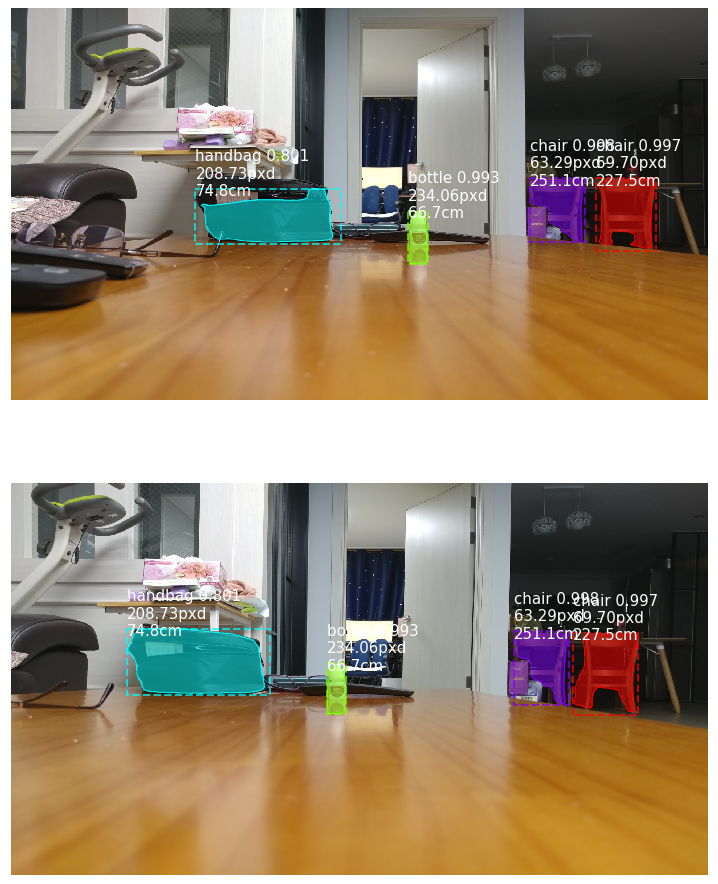

In [18]:
image1 = skimage.io.imread(os.path.join(IMAGE_DIR, '20200303_215730.jpg'))
image2 = skimage.io.imread(os.path.join(IMAGE_DIR, '20200303_215740.jpg'))

# Run detection
results = model.detect([image1,image2], verbose=1)

# Visualize results
r1, r2 = results[0], results[1]

matelist = mate_classes(image1,image2,r1['rois'],r2['rois'],r1['class_ids'],r2['class_ids'],r1['masks'],r2['masks'],r1['scores'],r2['scores'])

display_compare_instances(image1, image2, matelist,class_names) #70cm distance

Processing 2 images
image                    shape: (1080, 1920, 3)       min:    0.00000  max:  255.00000  uint8
image                    shape: (1080, 1920, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (2, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (2, 93)               min:    0.00000  max: 1920.00000  float64
anchors                  shape: (2, 261888, 4)        min:   -0.35390  max:    1.29134  float32


E:\Anaconda3\envs\tensorflow1.3.0\lib\site-packages\ipykernel_launcher.py:19: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.


chair 0.998 58.23pxd 273.5cm
chair 0.997 67.42pxd 235.4cm
bottle 0.996 220.30pxd 70.9cm
dining table 0.971 13.50pxd 1297.4cm
handbag 0.833 202.10pxd 77.3cm


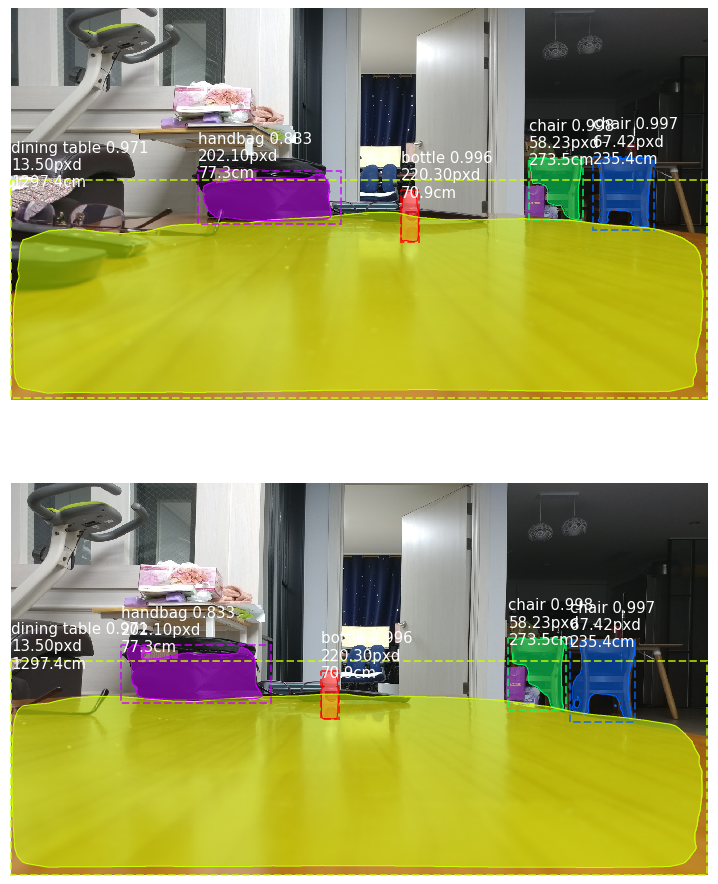

In [19]:
image1 = skimage.io.imread(os.path.join(IMAGE_DIR, '20200303_215843.jpg'))
image2 = skimage.io.imread(os.path.join(IMAGE_DIR, '20200303_215854.jpg'))

# Run detection
results = model.detect([image1,image2], verbose=1)

# Visualize results
r1, r2 = results[0], results[1]

matelist = mate_classes(image1,image2,r1['rois'],r2['rois'],r1['class_ids'],r2['class_ids'],r1['masks'],r2['masks'],r1['scores'],r2['scores'])

display_compare_instances(image1, image2, matelist,class_names) #75cm distance

Processing 2 images
image                    shape: (1080, 1920, 3)       min:    0.00000  max:  255.00000  uint8
image                    shape: (1080, 1920, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (2, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (2, 93)               min:    0.00000  max: 1920.00000  float64
anchors                  shape: (2, 261888, 4)        min:   -0.35390  max:    1.29134  float32


E:\Anaconda3\envs\tensorflow1.3.0\lib\site-packages\ipykernel_launcher.py:19: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.


chair 0.998 50.57pxd 316.3cm
chair 0.997 38.01pxd 425.2cm
bottle 0.969 197.37pxd 79.2cm
dining table 0.956 18.12pxd 935.8cm
book 0.886 86.12pxd 183.3cm
handbag 0.856 177.51pxd 88.1cm


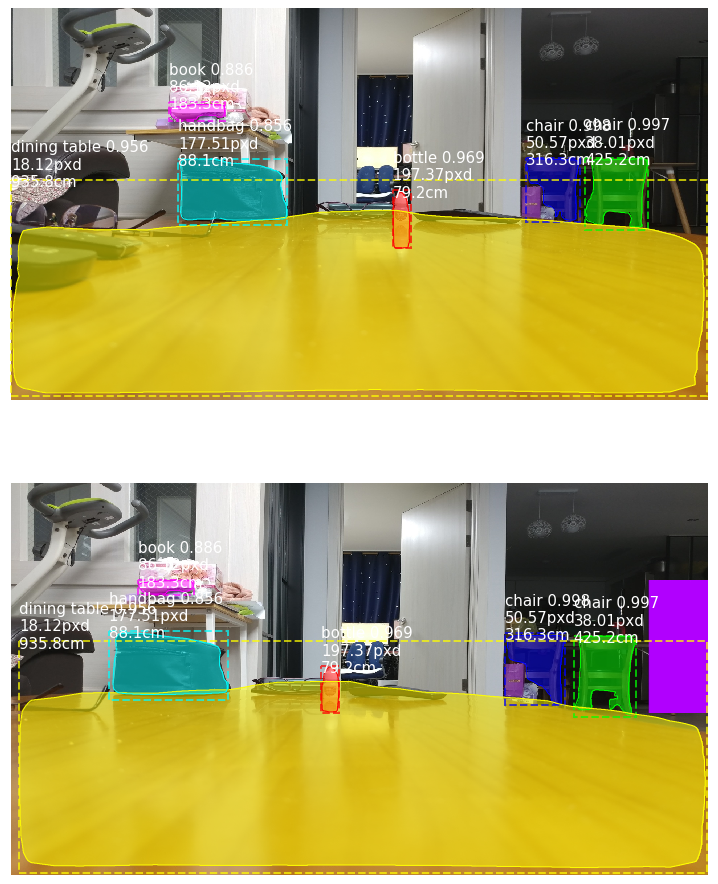

In [20]:
image1 = skimage.io.imread(os.path.join(IMAGE_DIR, '20200303_220006.jpg'))
image2 = skimage.io.imread(os.path.join(IMAGE_DIR, '20200303_220018.jpg'))

# Run detection
results = model.detect([image1,image2], verbose=1)

# Visualize results
r1, r2 = results[0], results[1]

matelist = mate_classes(image1,image2,r1['rois'],r2['rois'],r1['class_ids'],r2['class_ids'],r1['masks'],r2['masks'],r1['scores'],r2['scores'])

display_compare_instances(image1, image2, matelist,class_names) #80cm distance

Processing 2 images
image                    shape: (1080, 1920, 3)       min:    0.00000  max:  255.00000  uint8
image                    shape: (1080, 1920, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (2, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (2, 93)               min:    0.00000  max: 1920.00000  float64
anchors                  shape: (2, 261888, 4)        min:   -0.35390  max:    1.29134  float32


E:\Anaconda3\envs\tensorflow1.3.0\lib\site-packages\ipykernel_launcher.py:19: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.


chair 0.997 56.72pxd 281.0cm
chair 0.997 57.38pxd 277.7cm
dining table 0.950 20.16pxd 833.3cm
bottle 0.939 183.00pxd 85.4cm
handbag 0.845 172.82pxd 90.5cm


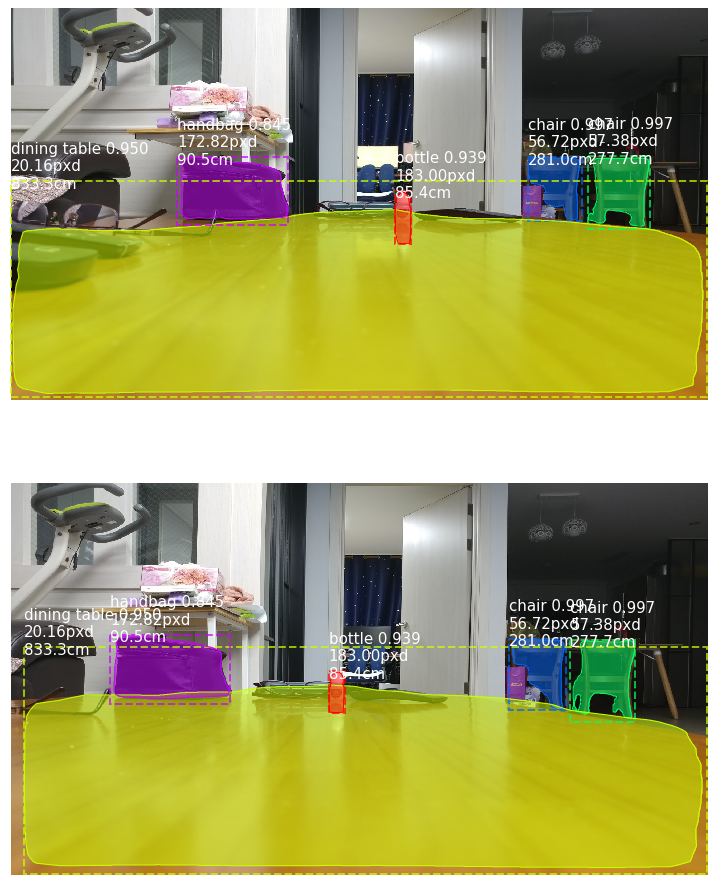

In [21]:
image1 = skimage.io.imread(os.path.join(IMAGE_DIR, '20200303_220135.jpg'))
image2 = skimage.io.imread(os.path.join(IMAGE_DIR, '20200303_220142.jpg'))

# Run detection
results = model.detect([image1,image2], verbose=1)

# Visualize results
r1, r2 = results[0], results[1]

matelist = mate_classes(image1,image2,r1['rois'],r2['rois'],r1['class_ids'],r2['class_ids'],r1['masks'],r2['masks'],r1['scores'],r2['scores'])

display_compare_instances(image1, image2, matelist,class_names) #85cm distance

Processing 2 images
image                    shape: (1080, 1920, 3)       min:    0.00000  max:  255.00000  uint8
image                    shape: (1080, 1920, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (2, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (2, 93)               min:    0.00000  max: 1920.00000  float64
anchors                  shape: (2, 261888, 4)        min:   -0.35390  max:    1.29134  float32


E:\Anaconda3\envs\tensorflow1.3.0\lib\site-packages\ipykernel_launcher.py:19: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.


chair 0.998 45.89pxd 349.6cm
chair 0.996 46.54pxd 344.6cm
dining table 0.963 28.02pxd 585.7cm
handbag 0.845 168.27pxd 93.0cm


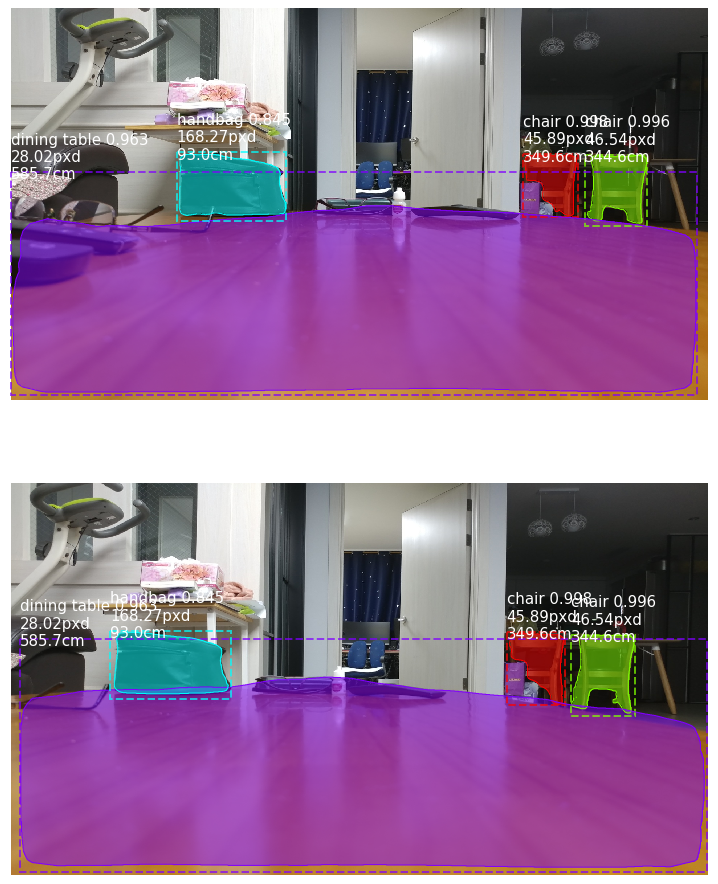

In [22]:
image1 = skimage.io.imread(os.path.join(IMAGE_DIR, '20200303_220247.jpg'))
image2 = skimage.io.imread(os.path.join(IMAGE_DIR, '20200303_220256.jpg'))

# Run detection
results = model.detect([image1,image2], verbose=1)

# Visualize results
r1, r2 = results[0], results[1]

matelist = mate_classes(image1,image2,r1['rois'],r2['rois'],r1['class_ids'],r2['class_ids'],r1['masks'],r2['masks'],r1['scores'],r2['scores'])

display_compare_instances(image1, image2, matelist,class_names) #90cm distance

Processing 2 images
image                    shape: (1080, 1920, 3)       min:    0.00000  max:  255.00000  uint8
image                    shape: (1080, 1920, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (2, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (2, 93)               min:    0.00000  max: 1920.00000  float64
anchors                  shape: (2, 261888, 4)        min:   -0.35390  max:    1.29134  float32


E:\Anaconda3\envs\tensorflow1.3.0\lib\site-packages\ipykernel_launcher.py:19: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.


chair 0.998 37.71pxd 428.7cm
chair 0.997 44.63pxd 359.9cm
chair 0.994 29.26pxd 559.5cm
bottle 0.973 160.23pxd 97.7cm
dining table 0.947 54.60pxd 292.2cm


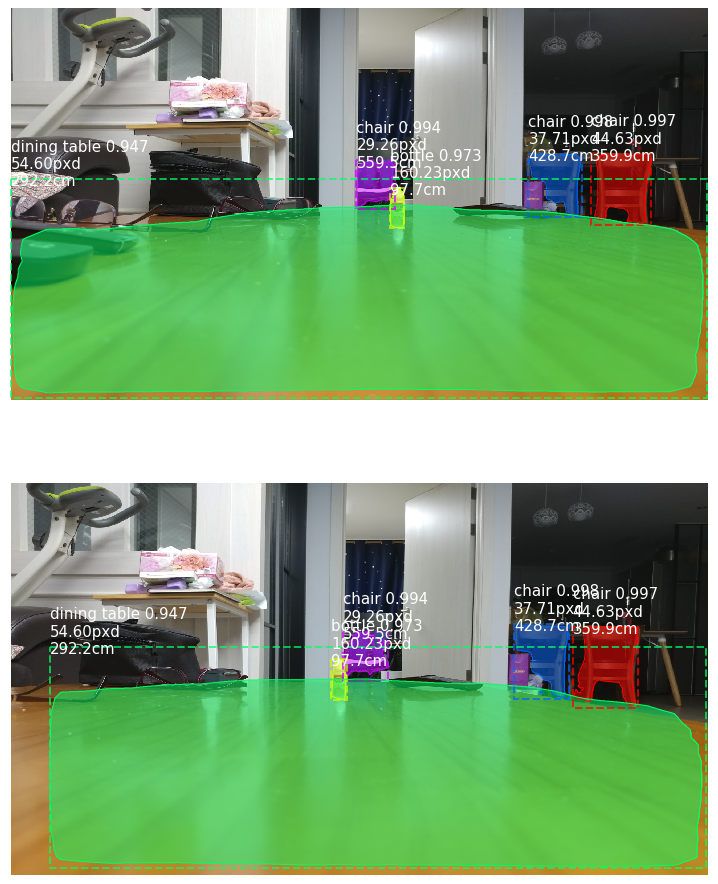

In [23]:
image1 = skimage.io.imread(os.path.join(IMAGE_DIR, '20200303_220435.jpg'))
image2 = skimage.io.imread(os.path.join(IMAGE_DIR, '20200303_220445.jpg'))

# Run detection
results = model.detect([image1,image2], verbose=1)

# Visualize results
r1, r2 = results[0], results[1]

matelist = mate_classes(image1,image2,r1['rois'],r2['rois'],r1['class_ids'],r2['class_ids'],r1['masks'],r2['masks'],r1['scores'],r2['scores'])

display_compare_instances(image1, image2, matelist,class_names) #95cm distance

Processing 2 images
image                    shape: (1080, 1920, 3)       min:    0.00000  max:  255.00000  uint8
image                    shape: (1080, 1920, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (2, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (2, 93)               min:    0.00000  max: 1920.00000  float64
anchors                  shape: (2, 261888, 4)        min:   -0.35390  max:    1.29134  float32


E:\Anaconda3\envs\tensorflow1.3.0\lib\site-packages\ipykernel_launcher.py:19: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.


chair 0.997 47.90pxd 334.5cm
chair 0.996 44.52pxd 360.8cm
dining table 0.977 10.31pxd 1770.4cm
chair 0.973 27.39pxd 600.0cm
bottle 0.964 149.61pxd 104.7cm


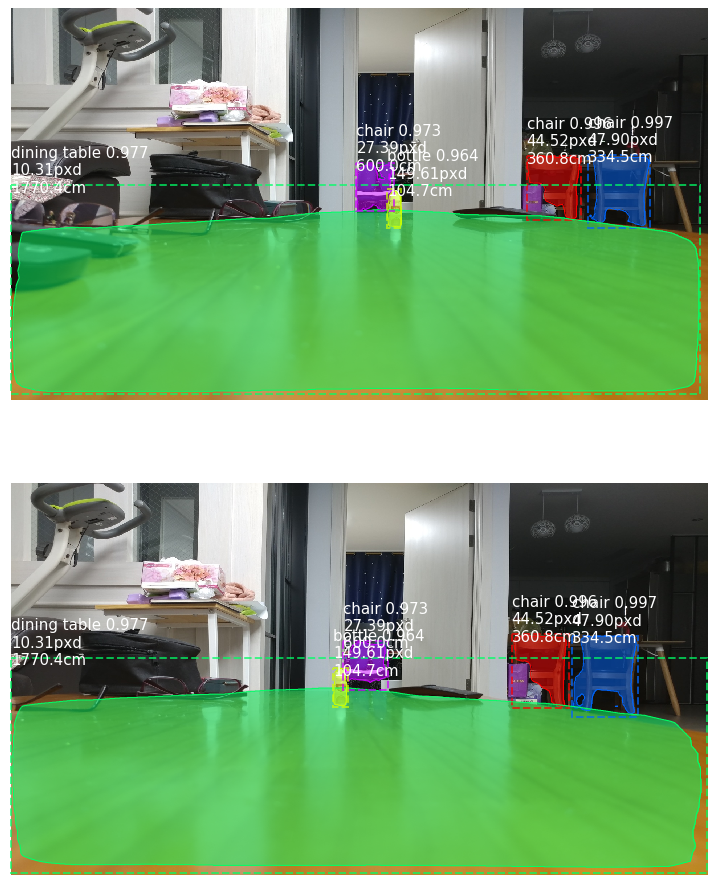

In [24]:
image1 = skimage.io.imread(os.path.join(IMAGE_DIR, '20200303_220555.jpg'))
image2 = skimage.io.imread(os.path.join(IMAGE_DIR, '20200303_220603.jpg'))

# Run detection
results = model.detect([image1,image2], verbose=1)

# Visualize results
r1, r2 = results[0], results[1]

matelist = mate_classes(image1,image2,r1['rois'],r2['rois'],r1['class_ids'],r2['class_ids'],r1['masks'],r2['masks'],r1['scores'],r2['scores'])

display_compare_instances(image1, image2, matelist,class_names) #100cm distance